In [1]:
import os
import pickle
import random
import glob
import datetime
import pandas as pd
import numpy as np
import cv2
import pydicom
from tqdm import tqdm
from joblib import delayed, Parallel
import zipfile
from pydicom.filebase import DicomBytesIO
import sys
from PIL import Image



# importing pyplot and image from matplotlib 
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg 




In [4]:
base_url = '/home/ubuntu/kaggle/rsna-intracranial-hemorrhage-detection/'

In [5]:
train_df = pd.read_csv(f'{base_url}/stage_2_train.csv').drop_duplicates()
train_df['ImageID'] = train_df['ID'].str.slice(stop=12)
train_df['Diagnosis'] = train_df['ID'].str.slice(start=13)
train_labels = train_df.pivot(index="ImageID", columns="Diagnosis", values="Label")
train_labels.head()

Diagnosis,any,epidural,intraparenchymal,intraventricular,subarachnoid,subdural
ImageID,,,,,,
ID_000012eaf,0,0,0,0,0,0
ID_000039fa0,0,0,0,0,0,0
ID_00005679d,0,0,0,0,0,0
ID_00008ce3c,0,0,0,0,0,0
ID_0000950d7,0,0,0,0,0,0


In [6]:
train_metadata = pd.read_parquet(f'{base_url}/train_metadata.parquet.gzip')
test_metadata = pd.read_parquet(f'{base_url}/test_metadata.parquet.gzip')

train_metadata["Dataset"] = "train"
test_metadata["Dataset"] = "test"

train_metadata = train_metadata.join(train_labels)

metadata = pd.concat([train_metadata, test_metadata], sort=True)
metadata.sort_values(by="ImagePositionPatient_2", inplace=True, ascending=False)
metadata.head()

,BitsAllocated,BitsStored,Columns,Dataset,HighBit,ImageOrientationPatient_0,ImageOrientationPatient_1,ImageOrientationPatient_2,ImageOrientationPatient_3,ImageOrientationPatient_4,...,StudyID,StudyInstanceUID,WindowCenter,WindowWidth,any,epidural,intraparenchymal,intraventricular,subarachnoid,subdural
Image,,,,,,,,,,,,,,,,,,,,,
ID_24250ffbc,16,12,512,train,11,1.0,0.0,0.0,0.0,0.920505,...,,ID_6222a3935b,40.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0
ID_6e8c8d650,16,12,512,train,11,1.0,0.0,0.0,0.0,0.920505,...,,ID_6222a3935b,40.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0
ID_ac042708d,16,12,512,train,11,1.0,0.0,0.0,0.0,0.920505,...,,ID_6222a3935b,40.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0
ID_d1e2a17a9,16,12,512,train,11,1.0,0.0,0.0,0.0,0.927184,...,,ID_a5fb903898,40.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0
ID_e1a1b45a5,16,12,512,train,11,1.0,0.0,0.0,0.0,0.920505,...,,ID_6222a3935b,40.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
TRAIN_DIR = '/home/ubuntu/kaggle/rsna-intracranial-hemorrhage-detection/png/train/brain-subdural-bone/'
TRAIN_DIR_1 = '/home/ubuntu/kaggle/rsna-intracranial-hemorrhage-detection/png/train/adjacent-brain-cropped/'

# Intraparenchymal

In [12]:
index = metadata[(metadata['intraparenchymal'] == 1) & (metadata['intraventricular'] != 1) & (metadata['epidural'] != 1) & (metadata['subarachnoid'] != 1) & (metadata['subdural'] != 1)].index[:12]

In [13]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

In [21]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

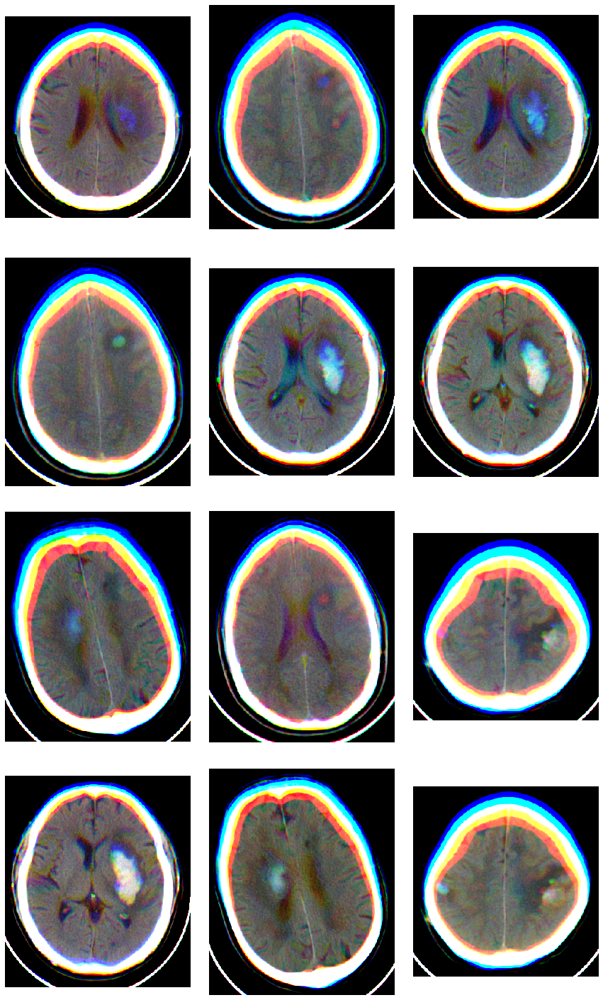

<Figure size 432x288 with 0 Axes>

In [22]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)
for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Intraparenchymal_method_1.png')

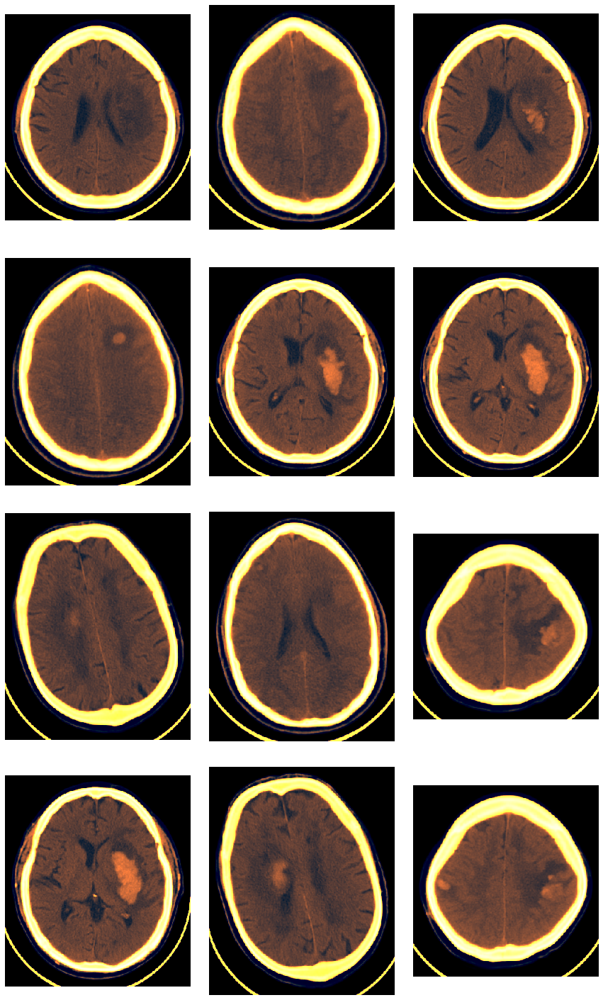

<Figure size 432x288 with 0 Axes>

In [19]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)
#plt.xaxis.set_visible(False)
#plt.yaxis.set_visible(False)
for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Intraparenchymal_method_2.png')

# Intraventricular

In [106]:
index = metadata[(metadata['intraparenchymal'] != 1) & (metadata['intraventricular'] == 1) & (metadata['epidural'] != 1) & (metadata['subarachnoid'] != 1) & (metadata['subdural'] != 1)].index[:10]

In [24]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [25]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

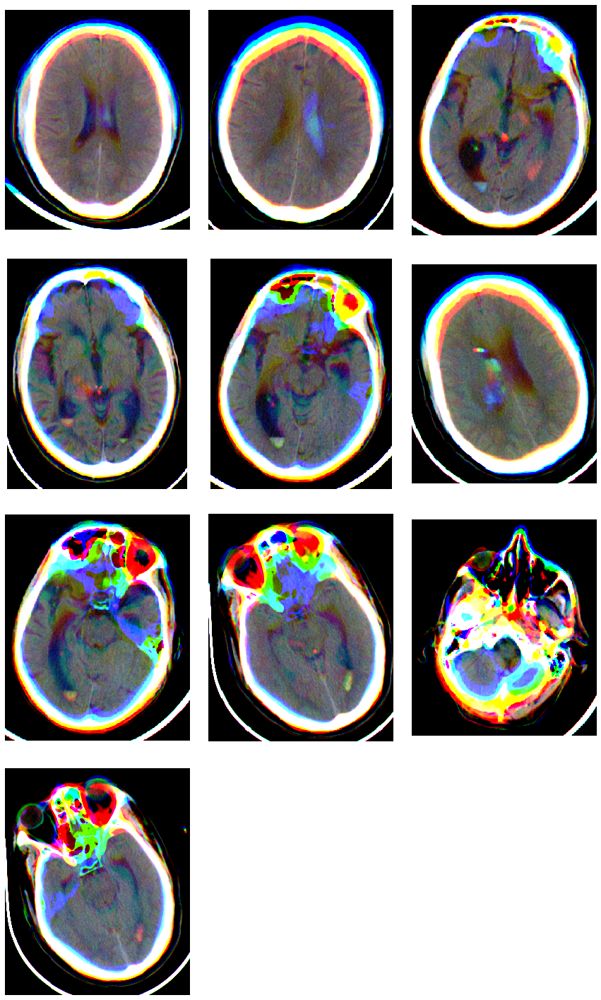

<Figure size 432x288 with 0 Axes>

In [26]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Intraventricular_method_1.png')

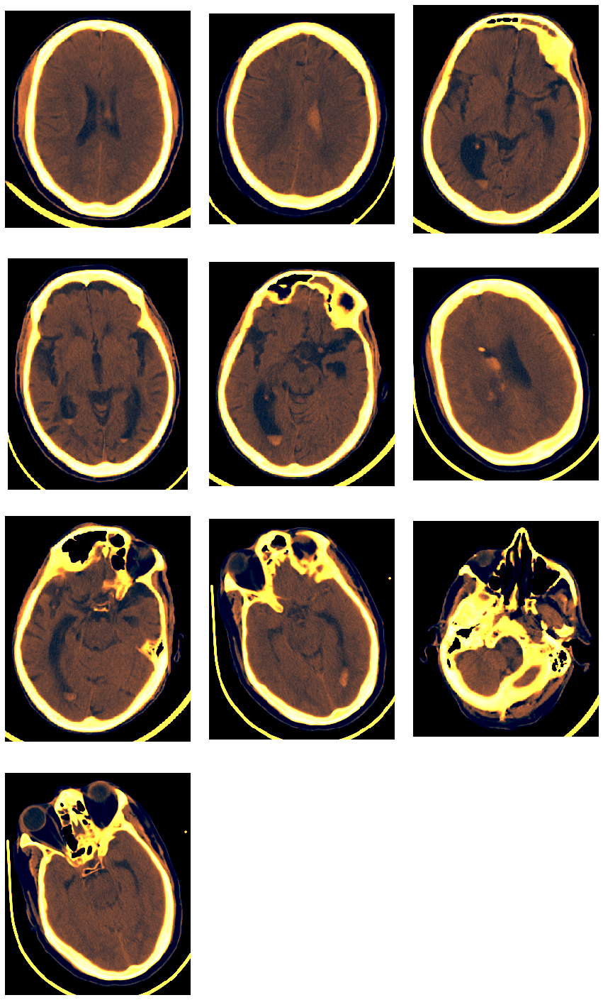

<Figure size 432x288 with 0 Axes>

In [27]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Intraventricular_method_2.png')

# Epidural 

In [116]:
index = metadata[(metadata['intraparenchymal'] != 1) & (metadata['intraventricular'] != 1) & (metadata['epidural'] == 1) & (metadata['subarachnoid'] != 1) & (metadata['subdural'] != 1)].index[:10]

In [117]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [118]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

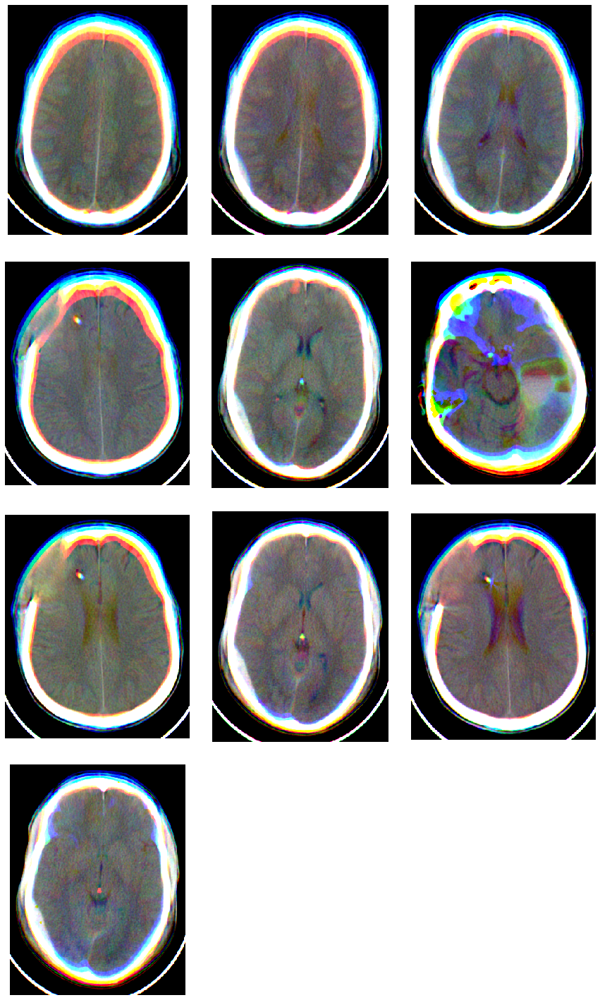

<Figure size 432x288 with 0 Axes>

In [119]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Epidural_method_1.png')

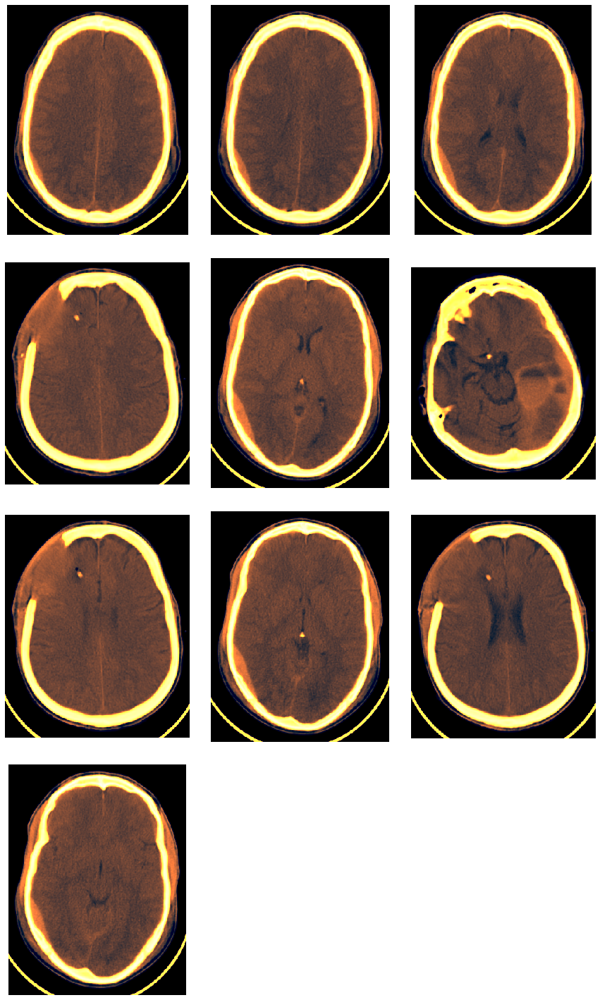

<Figure size 432x288 with 0 Axes>

In [120]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Epidural_method_2.png')

# Subarachnoid

In [74]:
index = metadata[(metadata['intraparenchymal'] != 1) & (metadata['intraventricular'] != 1) & (metadata['epidural'] != 1) & (metadata['subarachnoid'] == 1) & (metadata['subdural'] != 1)].index[:10]

In [34]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [35]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

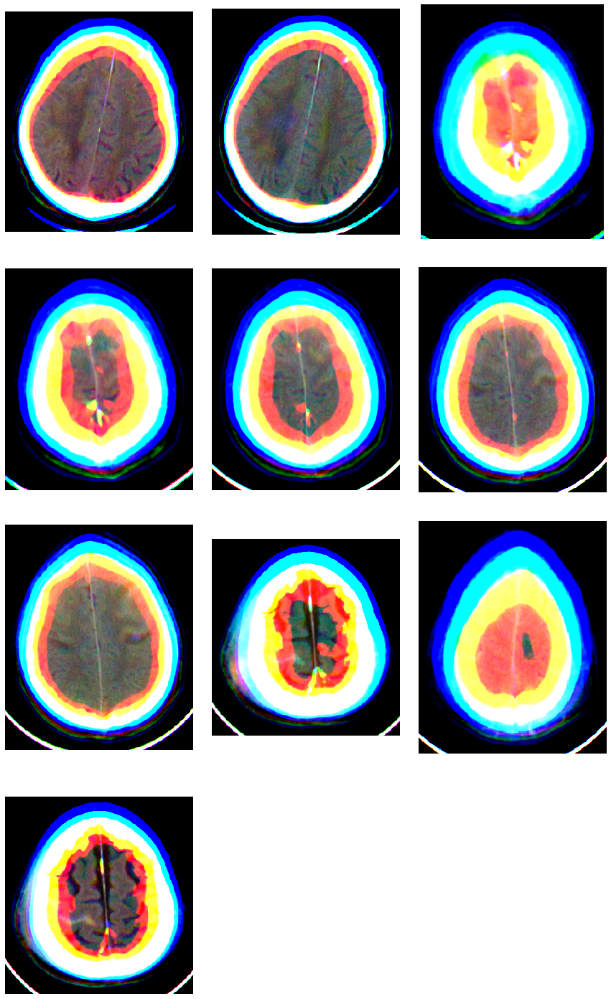

<Figure size 432x288 with 0 Axes>

In [36]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Subarachnoid_method_1.png')

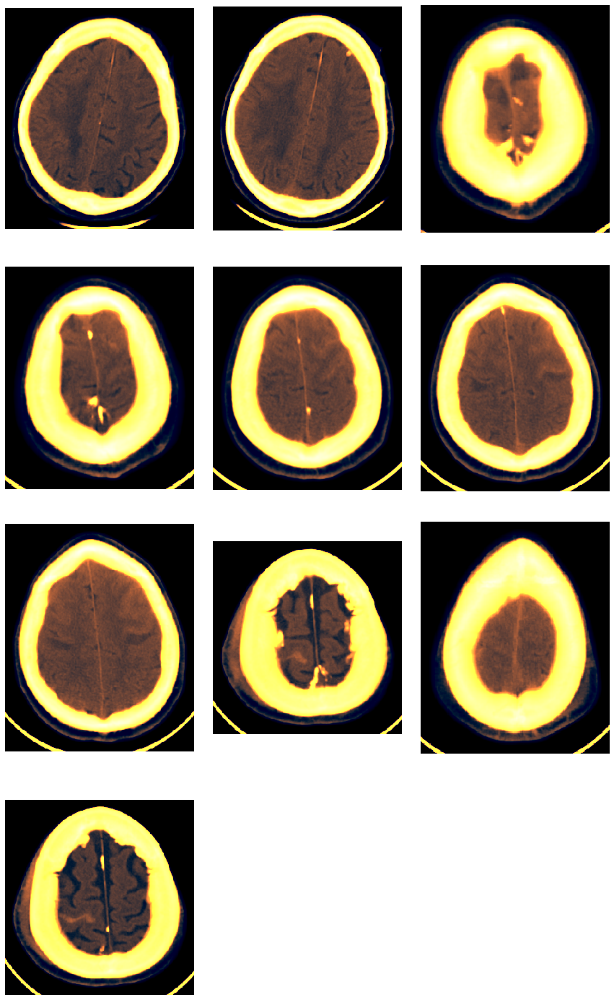

<Figure size 432x288 with 0 Axes>

In [37]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Subarachnoid_method_2.png')

# Subdural

In [121]:
index = metadata[(metadata['intraparenchymal'] != 1) & (metadata['intraventricular'] != 1) & (metadata['epidural'] != 1) & (metadata['subarachnoid'] != 1) & (metadata['subdural'] == 1)].index[:10]

In [122]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [123]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

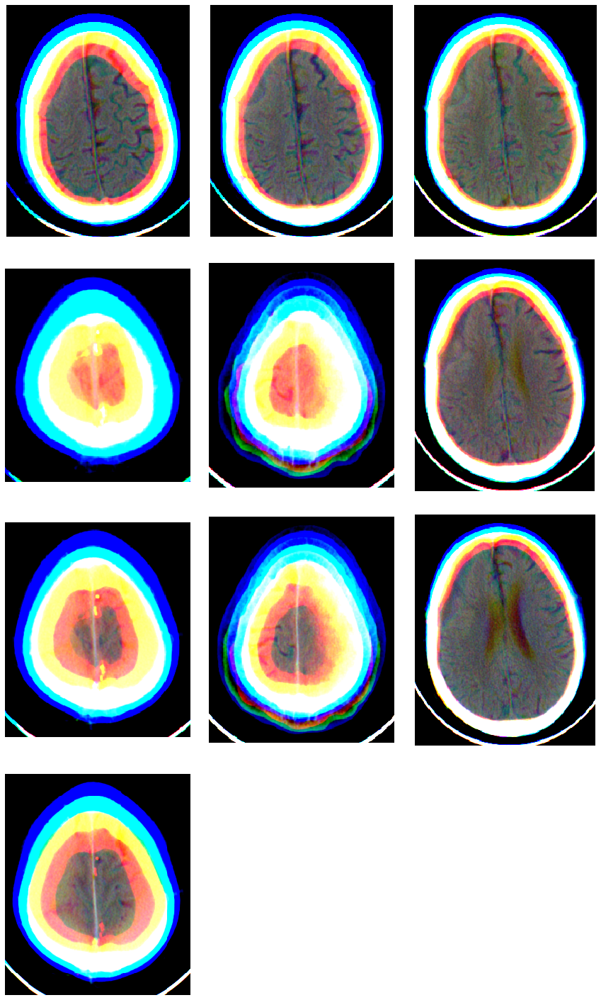

<Figure size 432x288 with 0 Axes>

In [124]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Subdural_method_1.png')

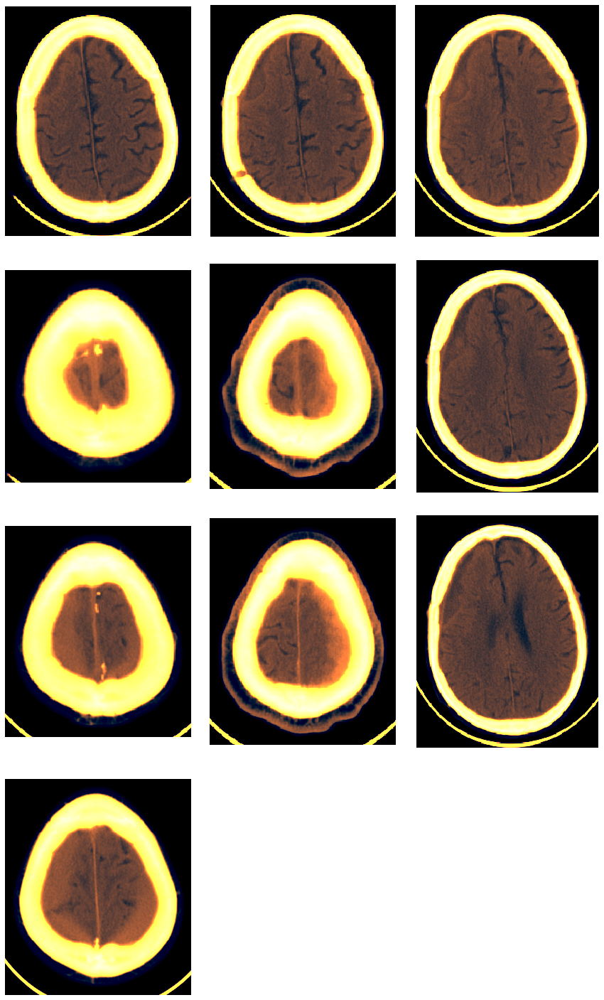

<Figure size 432x288 with 0 Axes>

In [125]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(4,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
plt.savefig('Subdural_method_2.png')

In [115]:
ls

 Epidural_method_1.png                            Subdural_method_2.png
 Epidural_method_2.png                            Untitled.ipynb
 Intraparenchymal_method_1.png                    Visualization.ipynb
 Intraparenchymal_method_2.png                    df.tar.gz
 Intraventricular_method_1.png                    load_data.ipynb
 Intraventricular_method_2.png                    load_data.py
 RGB_images.ipynb                                 preprocessing_1.ipynb
'Reconstructing 3D volumes from metadata.ipynb'   preprocessing_1.py
 Subarachnoid_method_1.png                       'preprocessing_2 (1).py'
 Subarachnoid_method_2.png                        preprocessing_2.ipynb
 Subdural_method_1.png                            train_new


# Metadata

In [96]:
metadata[['PatientID','any','epidural','intraparenchymal','intraventricular','subarachnoid','subdural']].head()

,PatientID,any,epidural,intraparenchymal,intraventricular,subarachnoid,subdural
Image,,,,,,,
ID_24250ffbc,ID_362cf84d,0.0,0.0,0.0,0.0,0.0,0.0
ID_6e8c8d650,ID_362cf84d,0.0,0.0,0.0,0.0,0.0,0.0
ID_ac042708d,ID_362cf84d,0.0,0.0,0.0,0.0,0.0,0.0
ID_d1e2a17a9,ID_fc5130c1,0.0,0.0,0.0,0.0,0.0,0.0
ID_e1a1b45a5,ID_362cf84d,0.0,0.0,0.0,0.0,0.0,0.0


# Total number of patient

In [60]:
metadata[['PatientID']].nunique()

PatientID    22456
dtype: int64

## To Check for patientId for each image

In [108]:
metadata[metadata.index == 'ID_943b5edc6']['PatientID']

Image
ID_943b5edc6    ID_d1faff3c
Name: PatientID, dtype: object

## CT Scan of Patient with Intraventicular

In [109]:
 index = metadata[metadata['PatientID'] == 'ID_d1faff3c'].index[4:]


In [110]:
len(index)

24

In [111]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [112]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

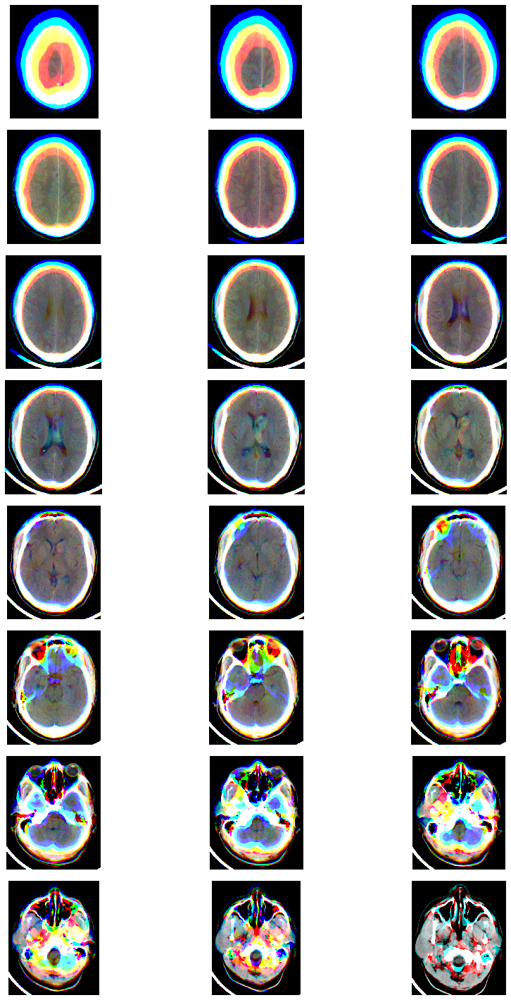

In [113]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(8,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()


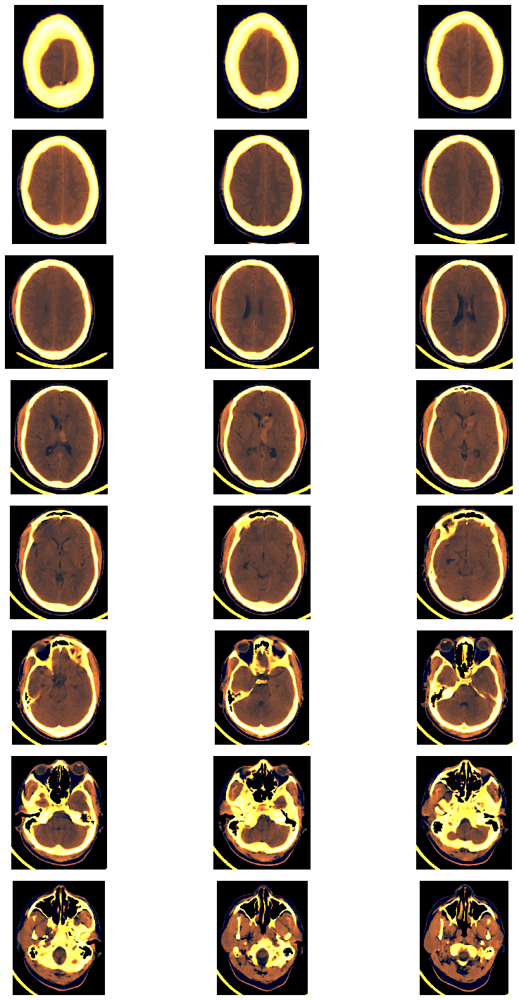

In [114]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(8,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()


## CT Scan of Patient with Subarachnoid

In [87]:
 index = metadata[metadata['PatientID'] == 'ID_f5481463'].index[4:]


In [88]:
len(index)

24

In [89]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [90]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

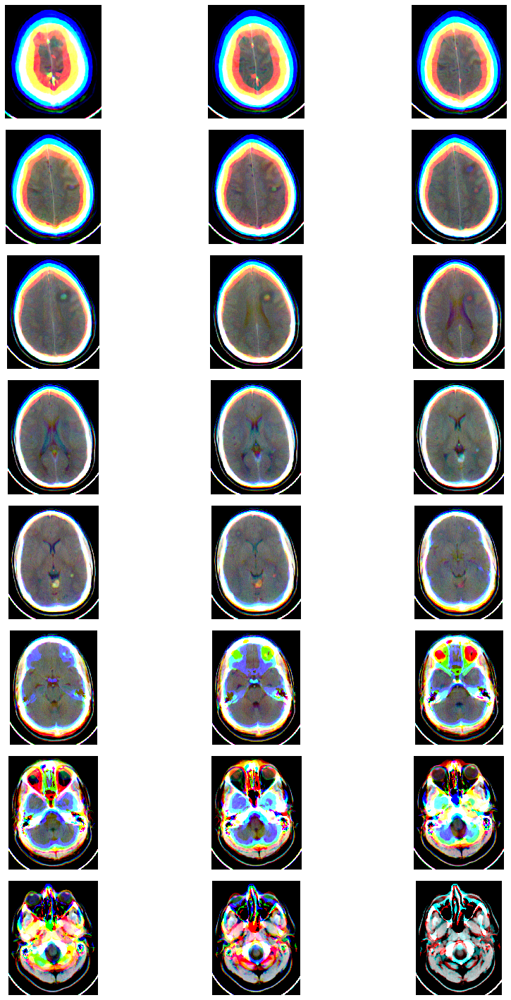

In [91]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(8,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()


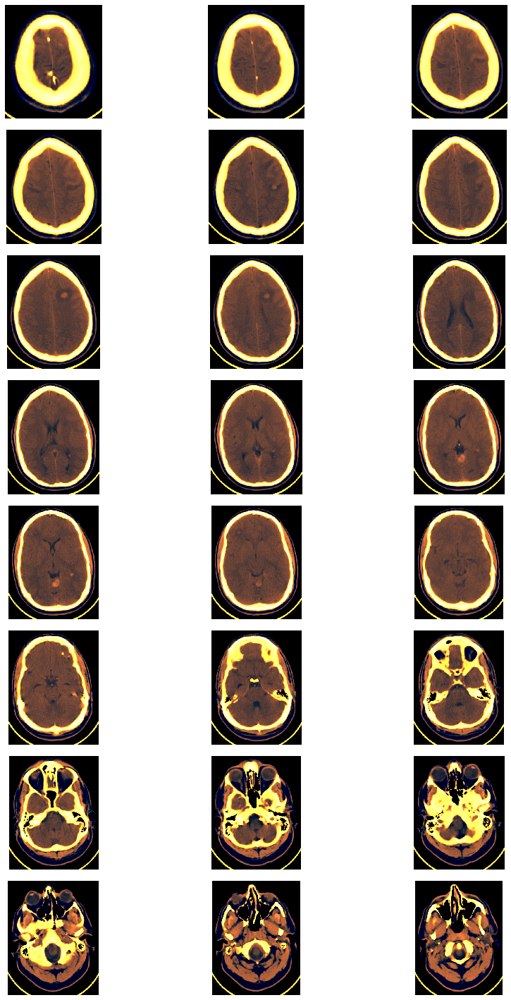

In [92]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(8,3,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()


## CT Scan of Patient with Epidural

On average each person have 32 CT Scan to check for Hemorrhage presence. the number of CT scan varies a lot between 20 to 60 number per person

In [66]:
 index = metadata[metadata['PatientID'] == 'ID_362cf84d'].index

In [ ]:
len(index)

In [67]:
img_1 = dict()
for i,value in enumerate(index): 
    img_1[i] = TRAIN_DIR_1+value

In [72]:
img = dict()
for i,value in enumerate(index): 
    img[i] = TRAIN_DIR+value

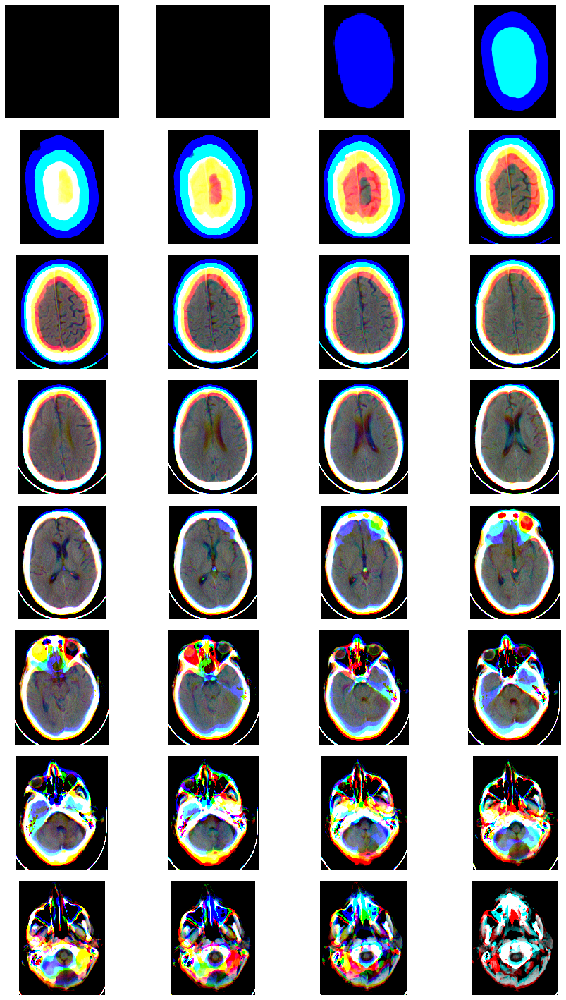

<Figure size 432x288 with 0 Axes>

In [70]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img_1.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(8,4,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()


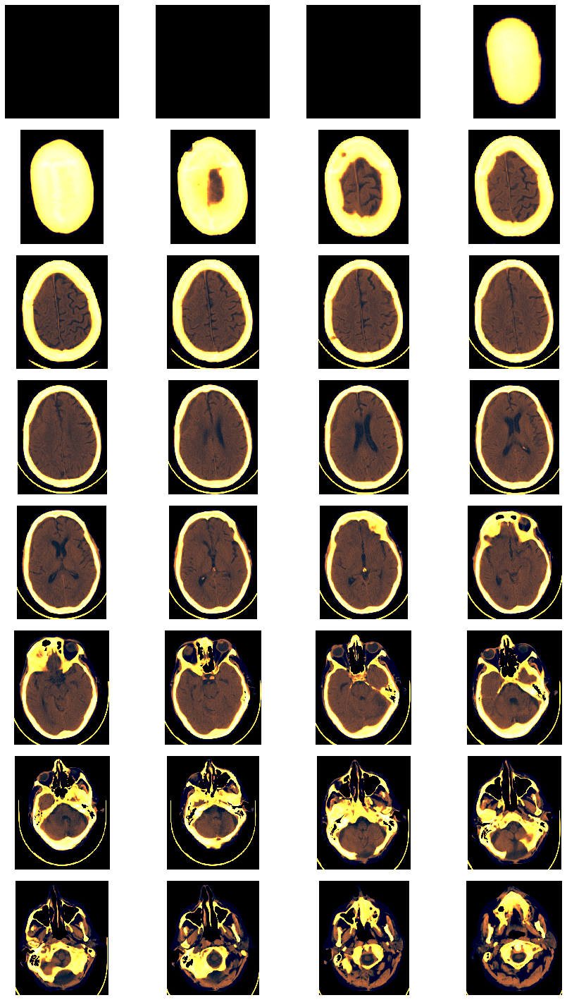

<Figure size 432x288 with 0 Axes>

In [73]:
fig = plt.figure(figsize=(15,25))
plt.subplots_adjust(hspace=0.01)

for i,img1 in img.items():           
    img2 = mpimg.imread(img1+'.png')
    plt.subplot(8,4,i+1)
    plt.subplots_adjust(hspace=0.1, wspace = 0.1,bottom =0.1)
    plt.axis("off")
    plt.imshow(img2, cmap = plt.cm.bone)
plt.show()
